In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

file = ("IFND__.csv")

!pip install chardet
import chardet
with open(file, 'rb') as rawdata:
    result = chardet.detect(rawdata.read(100000))
result
df = pd.read_csv(file, encoding = "ISO-8859-1")
df.head()



d.head()

,id,Statement,Web,Category,Date,Label
0,14098,PIL in Delhi HC for imposing lockdown in City ...,TRIBUNEINDIA,COVID-19,Jun-20,TRUE
1,20955,Railways to run two special trains to commute ...,THESTATESMAN,GOVERNMENT,Apr-20,TRUE
2,27136,Kamal Nath says all is well as Congress look...,THEPRINT,ELECTION,Dec-19,TRUE
3,20161,"ÔPMÕs constant blunders, indiscretions have fu...",THESTATESMAN,POLITICS,Jul-20,TRUE
4,4570,Tribal man returns to Odisha village after spe...,INDIANEXPRESS,TERROR,Nov-20,TRUE


In [ ]:
d.rename(columns={"Statement": "text"}, inplace=True)
d.head()


,id,text,Web,Category,Date,Label
0,14098,PIL in Delhi HC for imposing lockdown in City ...,TRIBUNEINDIA,COVID-19,Jun-20,TRUE
1,20955,Railways to run two special trains to commute ...,THESTATESMAN,GOVERNMENT,Apr-20,TRUE
2,27136,Kamal Nath says all is well as Congress look...,THEPRINT,ELECTION,Dec-19,TRUE
3,20161,"ÔPMÕs constant blunders, indiscretions have fu...",THESTATESMAN,POLITICS,Jul-20,TRUE
4,4570,Tribal man returns to Odisha village after spe...,INDIANEXPRESS,TERROR,Nov-20,TRUE


In [ ]:
import re
import string
from bs4 import BeautifulSoup #to lowercase, remove punctuations, remove links

def clean_text(text):
  if isinstance(text, float):  # Handle NaN or numerical values
        text = ""
  text = text.lower()
  text = re.sub(r'\d+', '', text)  # Correct digit removal regex
  text = text.translate(str.maketrans('','',string.punctuation)) #remove punctuations
  text= re.sub(r'\W',' ',text) #maintain spaces bw words
  text = BeautifulSoup(text,'html.parser').get_text() #remove any links in text
  return text

#What is a corpus ? The corpus is the final data which will be preprocessed.


clean_corpus = [clean_text(doc) for doc in d['text']] #Applied it to the docs

print(clean_corpus[0]) #this is literally one element of the array we will be dealing with

pil in delhi hc for imposing lockdown in city due to steep rise in covid cases


In [ ]:
def simple_tokenize(text):
    return text.split()

tokenized_corpus = [simple_tokenize(doc) for doc in clean_corpus]
print(tokenized_corpus)


[['pil', 'in', 'delhi', 'hc', 'for', 'imposing', 'lockdown', 'in', 'city', 'due', 'to', 'steep', 'rise', 'in', 'covid', 'cases'], ['railways', 'to', 'run', 'two', 'special', 'trains', 'to', 'commute', 'indian', 'army', 'personnel'], ['kamal', 'nath', 'says', 'all', 'is', 'well', 'as', 'congress', 'looks', 'to', 'escape', 'floor', 'test', 'in', 'mp'], ['ôpmõs', 'constant', 'blunders', 'indiscretions', 'have', 'fundamentally', 'weakened', 'indiaõ', 'rahul', 'gandhi'], ['tribal', 'man', 'returns', 'to', 'odisha', 'village', 'after', 'spending', 'years', 'in', 'pakistan', 'jail'], ['latest', 'live', 'up', 'cm', 'suspends', 'sp', 'dsp', 'in', 'hathras', 'case', 'narco', 'tests', 'planned'], ['travancore', 'royal', 'family', 'to', 'manage', 'kerala', 'temple', 'sc'], ['parliament', 'house', 'bans', 'washing', 'of', 'utensils', 'lunch', 'boxes'], ['physicallychallenged', 'man', 'beaten', 'to', 'death', 'in', 'up', 'on', 'false', 'childkidnapping', 'rumours'], ['busting', 'myths', 'and', 'fake

In [ ]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
filter_corpus = [[word for word in doc if word not in stop_words] for doc in tokenized_corpus]

print(filter_corpus)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


[['pil', 'delhi', 'hc', 'imposing', 'lockdown', 'city', 'due', 'steep', 'rise', 'covid', 'cases'], ['railways', 'run', 'two', 'special', 'trains', 'commute', 'indian', 'army', 'personnel'], ['kamal', 'nath', 'says', 'well', 'congress', 'looks', 'escape', 'floor', 'test', 'mp'], ['ôpmõs', 'constant', 'blunders', 'indiscretions', 'fundamentally', 'weakened', 'indiaõ', 'rahul', 'gandhi'], ['tribal', 'man', 'returns', 'odisha', 'village', 'spending', 'years', 'pakistan', 'jail'], ['latest', 'live', 'cm', 'suspends', 'sp', 'dsp', 'hathras', 'case', 'narco', 'tests', 'planned'], ['travancore', 'royal', 'family', 'manage', 'kerala', 'temple', 'sc'], ['parliament', 'house', 'bans', 'washing', 'utensils', 'lunch', 'boxes'], ['physicallychallenged', 'man', 'beaten', 'death', 'false', 'childkidnapping', 'rumours'], ['busting', 'myths', 'fake', 'news', 'around', 'coronavirus', 'outbreak'], ['retrograde', 'step', 'ima', 'govt', 'allowing', 'postgrad', 'ayurveda', 'docs', 'perform', 'surgery'], ['jk

In [ ]:
import nltk
from nltk.stem import PorterStemmer, WordNetLemmatizer
nltk.download('wordnet')
nltk.download('omw-1.4')

stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

stemmed_corpus = [[stemmer.stem(word) for word in doc] for doc in filter_corpus]

lemmatized_corpus = [[lemmatizer.lemmatize(word) for word in doc] for doc in filter_corpus]

# Print a sample to compare
print("Original:", filter_corpus[0][:10])
print("Stemmed:", stemmed_corpus[0][:10])
print("Lemmatized:", lemmatized_corpus[0][:10])

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


Original: ['pil', 'delhi', 'hc', 'imposing', 'lockdown', 'city', 'due', 'steep', 'rise', 'covid']
Stemmed: ['pil', 'delhi', 'hc', 'impos', 'lockdown', 'citi', 'due', 'steep', 'rise', 'covid']
Lemmatized: ['pil', 'delhi', 'hc', 'imposing', 'lockdown', 'city', 'due', 'steep', 'rise', 'covid']


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
processed_docs = [' '.join(doc) for doc in lemmatized_corpus]
vectorizer = TfidfVectorizer(max_features=150)
X = vectorizer.fit_transform(processed_docs)

y = d['Label'].map({'Fake': 0, 'TRUE': 1})

print(f"Feature matrix shape: {X.shape}")
print(f"Target variable distribution: {y.value_counts()}")

Feature matrix shape: (56714, 150)
Target variable distribution: Label
1    37800
0    18914
Name: count, dtype: int64


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

print(f"Training set shape: {X_train.shape}")
print(f"Testing set shape: {X_test.shape}")

Training set shape: (45371, 150)
Testing set shape: (11343, 150)


In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)


In [ ]:
print(d.duplicated().sum())  # Check duplicate rows
print(X_train.shape, X_test.shape)  # Verify split is correct


0
(45371, 150) (11343, 150)


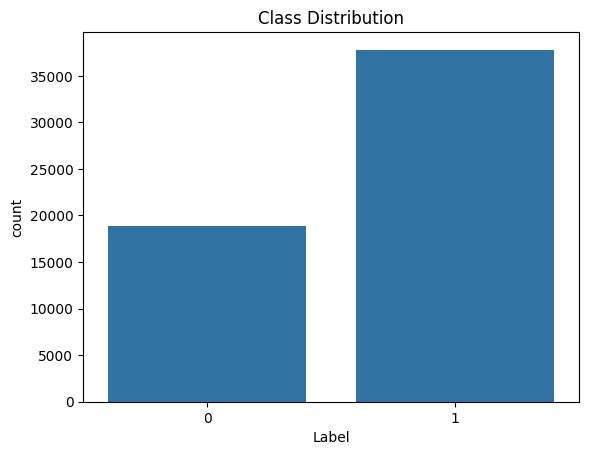

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(x=y)
plt.title("Class Distribution")
plt.show()


Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
Training Optimized Random Forest model...
Random Forest Accuracy: 0.9218

Classification Report:
              precision    recall  f1-score   support

        FAKE       0.95      0.80      0.87      3783
        REAL       0.91      0.98      0.94      7560

    accuracy                           0.92     11343
   macro avg       0.93      0.89      0.91     11343
weighted avg       0.92      0.92      0.92     11343



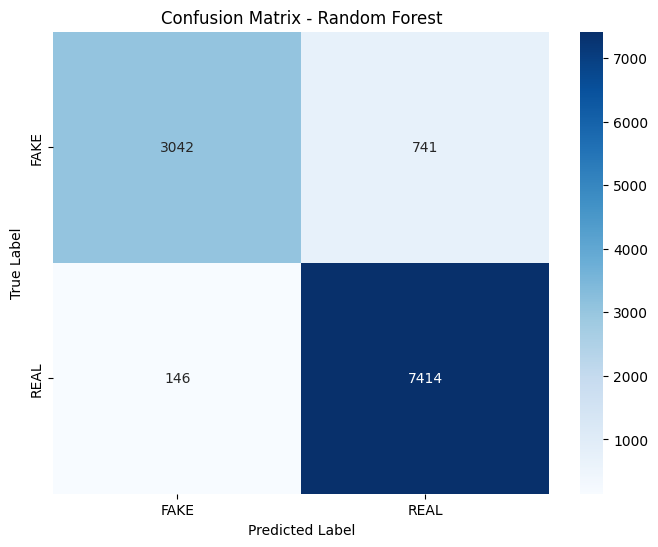

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt


param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}


grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_train, y_train)

best_rf = grid_search.best_estimator_

print("Best Parameters:", grid_search.best_params_)

# Train the best model
print("Training Optimized Random Forest model...")
best_rf.fit(X_train, y_train)

# Predict
y_pred = best_rf.predict(X_test)

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Random Forest Accuracy: {accuracy:.4f}")

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=['FAKE', 'REAL']))

# Confusion Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['FAKE', 'REAL'], yticklabels=['FAKE', 'REAL'])
plt.title('Confusion Matrix - Random Forest')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()
